<a href="https://colab.research.google.com/github/skyswpark/GEOL0069_Project/blob/main/Project_Part_2_Supervised_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# This project aims to...

1. Conduct supervised and unsupervised classification for a Sentinel-3 image
2. Use the classifications to train two different models (using supervised and unsupervised classification respectively)
3. Comparison of the two different models


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install netCDF4

# From Week 2

In [3]:
# Specify your path to files
datadir = '/content/drive/MyDrive/GEOL0069/Project/DATA'

In [4]:
import os
import numpy as np
X_train = np.load(os.path.join('/content/drive/MyDrive/GEOL0069/Project/DATA/X_train_balanced.npy'))
X_test = np.load(os.path.join('/content/drive/MyDrive/GEOL0069/Project/DATA/X_test_balanced.npy'))
y_train = np.load(os.path.join('/content/drive/MyDrive/GEOL0069/Project/DATA/y_train_balanced.npy'))
y_test = np.load(os.path.join('/content/drive/MyDrive/GEOL0069/Project/DATA/y_test_balanced.npy'))

In [5]:
import os
import numpy as np
X_train_c = np.load(os.path.join('/content/drive/MyDrive/GEOL0069/Project/DATA/X_train_balanced_c.npy'))
X_test_c = np.load(os.path.join('/content/drive/MyDrive/GEOL0069/Project/DATA/X_test_balanced_c.npy'))
y_train_c = np.load(os.path.join('/content/drive/MyDrive/GEOL0069/Project/DATA/y_train_balanced_c.npy'))
y_test_c = np.load(os.path.join('/content/drive/MyDrive/GEOL0069/Project/DATA/y_test_balanced_c.npy'))

In [6]:
# do pip install netCDF4 if needed
import netCDF4
import pyproj
import matplotlib.pyplot as plt
import numpy as np
from math import pi
from sklearn.feature_extraction import image

# Function to convert coordinates from WGS84 to EASE-Grid 2.0 projection
def WGS84toEASE2(lon, lat):
    # Initialise the EASE-Grid 2.0 projection
    proj_EASE2 = pyproj.Proj("+proj=laea +lon_0=0 +lat_0=90 +x_0=0 +y_0=0 +ellps=WGS84 +towgs84=0,0,0,0,0,0,0 +units=m +no_defs")
    # Initialise the WGS84 projection
    proj_WGS84 = pyproj.Proj("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")
    # Transform the coordinates from WGS84 to EASE-Grid 2.0
    x, y = pyproj.transform(proj_WGS84, proj_EASE2, lon, lat)
    return x, y

# Directory setup for data files
directory = '/content/drive/MyDrive/GEOL0069/Project/Week3/S3A_OL_1_EFR____20180307T054004_20180307T054119_20180308T091959_0075_028_319_1620_LN1_O_NT_002.SEN3'

# Load in geolocation data from a NetCDF file
geolocation = netCDF4.Dataset(directory+'/geo_coordinates.nc')
lat = geolocation.variables['latitude'][:]
lon = geolocation.variables['longitude'][:]

# Load in radiance data for a specific band (Band Oa01) from a NetCDF file
Band_Oa01 = netCDF4.Dataset(directory+'/Oa01_radiance.nc')
Oa01_Radiance = Band_Oa01.variables['Oa01_radiance'][:]

# Convert the longitude and latitude to EASE-Grid 2.0 coordinates
X, Y = WGS84toEASE2(lon, lat)

# Load in additional instrument data from a NetCDF file
OLCI_file_p = directory
instrument_data = netCDF4.Dataset(OLCI_file_p+'/instrument_data.nc')
solar_flux = instrument_data.variables['solar_flux'][:]
solar_flux_Band_Oa01 = solar_flux[0]  # Solar flux for Band Oa01
detector_index = instrument_data.variables['detector_index'][:]

# Load in tie geometries (e.g., Solar Zenith Angle) from a NetCDF file
tie_geometries = netCDF4.Dataset(OLCI_file_p+'/tie_geometries.nc')
SZA = tie_geometries.variables['SZA'][:]

# Initialise lists to store bands and patches
Bands = []
Patches = []

# Calculate the number of patches (nx, ny)
nx = X.shape[0] - 2
ny = X.shape[1] - 2
q = 0

# Process each band
for i in range(1, 5):  # Loop through 21 bands
    solar_flux_Band_Oa01 = solar_flux[q]
    print(i)
    bandnumber = '%02d' % (i)
    Band_Oa_temp = netCDF4.Dataset(directory+'/Oa'+bandnumber+'_radiance.nc')

    width = instrument_data.dimensions['columns'].size
    height = instrument_data.dimensions['rows'].size

    # Calculate the Top of Atmosphere Bidirectional Reflectance Factor (TOA BRF)
    TOA_BRF = np.zeros((height, width), dtype='float32')
    angle = np.zeros((TOA_BRF.shape[0], TOA_BRF.shape[1]))
    for x in range(TOA_BRF.shape[1]):
        angle[:, x] = SZA[:, int(x / 64)]

    oa = Band_Oa_temp.variables['Oa' + bandnumber + '_radiance'][:]
    TOA_BRF = np.zeros((height, width), dtype=float)
    TOA_BRF = np.pi * np.asarray(oa) / solar_flux_Band_Oa01[detector_index] / np.cos(np.radians(angle))

    Bands.append(TOA_BRF)
    # Extract patches of size 3x3 from the TOA BRF and reshape for further processing
    Patches.append(image.extract_patches_2d(np.array(TOA_BRF), (3, 3)).reshape(nx, ny, 3, 3))
    q += 1

# Convert the list of patches to a NumPy array and reshape for machine learning model input
Patches_array = np.asarray(Patches)
x_test_all = np.moveaxis(Patches_array, 0, -1).reshape(Patches_array.shape[1] * Patches_array.shape[2], 3, 3, 4)


<ipython-input-6-16c87dda0f4a>:16: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  x, y = pyproj.transform(proj_WGS84, proj_EASE2, lon, lat)


1
2
3
4


In [8]:
import os
import netCDF4
import numpy as np
import re

# Define the path to the main folder where your data is stored.
# You need to replace 'path/to/data' with the actual path to your data folder.
main_folder_path = '/content/drive/MyDrive/GEOL0069/Project/Week3/'

# This part of the code is responsible for finding all directories in the main_folder that end with '.SEN3'.
# '.SEN3' is the format of the folder containing specific satellite data files (in this case, OLCI data files).
directories = [d for d in os.listdir(main_folder_path) if os.path.isdir(os.path.join(main_folder_path, d)) and d.endswith('.SEN3')]

# Loop over each directory (i.e., each set of data) found above.
for directory in directories:
    # Construct the path to the OLCI data file within the directory.
    # This path is used to access the data files.
    OLCI_file_p = os.path.join(main_folder_path, directory)

    # Print the path to the current data file being processed.
    # This is helpful for tracking which file is being processed at any time.
    print(f"Processing: {OLCI_file_p}")

    # Load the instrument data from a file named 'instrument_data.nc' inside the directory.
    # This file contains various data about the instrument that captured the satellite data.
    instrument_data = netCDF4.Dataset(OLCI_file_p + '/instrument_data.nc')
    solar_flux = instrument_data.variables['solar_flux'][:]  # Extract the solar flux data.
    detector_index = instrument_data.variables['detector_index'][:]  # Extract the detector index.

    # Load tie geometries from a file named 'tie_geometries.nc'.
    # Tie geometries contain information about viewing angles, which are important for data analysis.
    tie_geometries = netCDF4.Dataset(OLCI_file_p + '/tie_geometries.nc')
    SZA = tie_geometries.variables['SZA'][:]  # Extract the Solar Zenith Angle (SZA).

    # Create a directory for saving the processed data using the original directory name.
    # This directory will be used to store output files.
    save_directory = os.path.join('/content/drive/MyDrive/GEOL0069/Project/Week3/', directory)
    if not os.path.exists(save_directory):
        os.makedirs(save_directory)

    # This loop processes each radiance band in the OLCI data.
    # OLCI instruments capture multiple bands, each representing different wavelengths.
    OLCI_data = []
    for Radiance in range(1, 5):  # There are 21 bands in OLCI data.

        Rstr = "%02d" % Radiance  # Formatting the band number.
        solar_flux_band = solar_flux[Radiance - 1]  # Get the solar flux for the current band.

        # Print information about the current band being processed.
        # This includes the band number and its corresponding solar flux.
        print(f"Processing Band: {Rstr}")
        print(f"Solar Flux for Band {Rstr}: {solar_flux_band}")

        # Load radiance values from the OLCI data file for the current band.
        OLCI_nc = netCDF4.Dataset(OLCI_file_p + '/Oa' + Rstr + '_radiance.nc')
        radiance_values = np.asarray(OLCI_nc['Oa' + Rstr + '_radiance'])

        # Initialize an array to store angle data, which will be calculated based on SZA.
        angle = np.zeros_like(radiance_values)
        for x in range(angle.shape[1]):
            angle[:, x] = SZA[:, int(x/64)]

        # Calculate the Top of Atmosphere Bidirectional Reflectance Factor (TOA BRF) for the current band.
        TOA_BRF = (np.pi * radiance_values) / (solar_flux_band[detector_index] * np.cos(np.radians(angle)))

        # Add the calculated TOA BRF data to the OLCI_data list.
        OLCI_data.append(TOA_BRF)

        # Print the range of reflectance values for the current band.
        print(f"Reflectance Values Range for Band {Rstr}: {np.nanmin(TOA_BRF)}, {np.nanmax(TOA_BRF)}")

    # Reshape the OLCI_data array for further analysis or visualization.
    reshaped_array = np.moveaxis(np.array(OLCI_data), 0, -1)
    print("Reshaped array shape:", reshaped_array.shape)

    # Split the reshaped array into smaller chunks along the second dimension.
    # This can be useful for handling large datasets more efficiently.
    split_arrays = np.array_split(reshaped_array, 5, axis=1)

    # Save each chunk of data separately.
    # This is helpful for processing or analyzing smaller portions of data at a time.
    for i, arr in enumerate(split_arrays):
        print(f"Chunk {i+1} shape:", arr.shape)
        save_path = os.path.join(save_directory, f"chunk_{i+1}_band_{Rstr}.npy")
        np.save(save_path, arr)
        print(f"Saved Chunk {i+1} for Band {Rstr} to {save_path}")

Processing: /content/drive/MyDrive/GEOL0069/Project/Week3/S3A_OL_1_EFR____20180307T054004_20180307T054119_20180308T091959_0075_028_319_1620_LN1_O_NT_002.SEN3
Processing Band: 01
Solar Flux for Band 01: [1544.2267 1544.1896 1544.1527 ... 1537.7228 1537.6968 1537.6708]
Reflectance Values Range for Band 01: 0.41084423661231995, 1640.9383544921875
Processing Band: 02
Solar Flux for Band 02: [1736.7196 1736.7112 1736.7029 ... 1733.3411 1733.3334 1733.3256]
Reflectance Values Range for Band 02: 0.3883616328239441, 1455.7120361328125
Processing Band: 03
Solar Flux for Band 03: [1927.833  1927.7999 1927.7668 ... 1916.0372 1916.0155 1915.9938]
Reflectance Values Range for Band 03: 0.32780033349990845, 1316.926513671875
Processing Band: 04
Solar Flux for Band 04: [1971.3087 1971.2881 1971.2675 ... 1963.3698 1963.359  1963.3484]
Reflectance Values Range for Band 04: 0.251146137714386, 1285.1630859375
Reshaped array shape: (1716, 4865, 4)
Chunk 1 shape: (1716, 973, 4)
Saved Chunk 1 for Band 04 to 

In [9]:
np.save('/content/drive/MyDrive/GEOL0069/Project/DATA/' + 'reshaped_array.npy', reshaped_array)

## Convolutional Neural Networks (CNN)

### Introduction to CNNs

Convolutional Neural Networks, commonly known as CNNs, are a class of deep neural networks specially designed to process data with grid-like topology, such as images {cite}`Goodfellow-et-al-2016,lecun2015deep`. Originating from the visual cortex's biological processes, CNNs are revolutionising the way we understand and interpret visual data.

### Why CNN for Image Data?

Traditional neural networks, when used for images, suffer from two main issues:

- **Too many parameters**: For a simple 256x256 colored image, an input layer would have \(256 * 256 * 3 = 196,608\) neurons, leading to an enormous number of parameters even in the first hidden layer.
- **Loss of spatial information**: Flattening an image into a vector for traditional neural networks can lose the spatial hierarchies and patterns in the image, which are often crucial for understanding and interpreting visual data.

CNNs address both issues by introducing convolutions.

### Key Components of CNN

1. **Convolutional Layer** {cite}`lecun2015deep`: This is the core building block of a CNN. It slides a filter (smaller in size than the input data) over the input data (like an image) to produce a feature map or convolved feature. The primary purpose of a convolution is to extract features from the input data.
2. **Pooling Layer**: Pooling layers are used to reduce the dimensions of the feature maps, thereby reducing the number of parameters and computation in the network. The most common type of pooling is max pooling.
3. **Fully Connected Layer**: After several convolutional and pooling layers, the final classification is done using one or more fully connected layers. Neurons in a fully connected layer have connections to all activations in the previous layer, as seen in regular neural networks.
4. **Activation Functions**: Non-linearity is introduced into the CNN using activation functions. The Rectified Linear Unit (ReLU) is the most commonly used activation function in CNNs.

### How CNNs Learn Spatial Hierarchies

CNNs learn spatial hierarchies automatically. The initial layers might learn to detect edges, the next layers learn to detect shapes by combining edges, further layers might detect more complex structures. This ability to learn spatial hierarchies from raw data gives CNNs their power. It allows them to detect complex objects in images by combining simpler features from the earlier layers.

### Advantages of CNNs

- **Parameter Sharing**: A feature detector (filter) that's useful in one part of the image can be useful in another part of the image {cite}`krizhevsky2012imagenet`.
- **Sparsity of Connections**: In each layer, each output value depends only on a small number of input values, making the computation more efficient.

### Basic Code Implementation

Below, you'll find a basic Convolutional Neural Network (CNN) structure implemented in TensorFlow. Treat this as a foundational blueprint for your subsequent implementations.



In [14]:
X_train = X_train[:,:,:,[2,5,7,16]]
X_test = X_test[:,:,:,[2,5,7,16]]

In [15]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Define the model
model_cnn = models.Sequential()
model_cnn.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(3, 3, 4), padding='SAME'))
model_cnn.add(layers.MaxPooling2D((2, 2)))
# Add additional convolutional and pooling layers as needed
# ...

# Add dense layers for classification
model_cnn.add(layers.Flatten())
model_cnn.add(layers.Dense(64, activation='relu'))
model_cnn.add(layers.Dense(10, activation='softmax'))  # 10 is the number of classes

# Compile and train the model
model_cnn.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
model_cnn.fit(X_train, y_train, epochs=10, validation_split=0.1)

Epoch 1/10
323/323 [==============================] - 3s 5ms/step - loss: 0.8146 - accuracy: 0.5053 - val_loss: 0.6911 - val_accuracy: 0.5083
Epoch 2/10
323/323 [==============================] - 2s 5ms/step - loss: 0.6893 - accuracy: 0.5439 - val_loss: 0.7081 - val_accuracy: 0.5083
Epoch 3/10
323/323 [==============================] - 2s 5ms/step - loss: 0.6840 - accuracy: 0.5531 - val_loss: 0.6762 - val_accuracy: 0.5909
Epoch 4/10
323/323 [==============================] - 1s 3ms/step - loss: 0.6760 - accuracy: 0.5751 - val_loss: 0.6946 - val_accuracy: 0.5135
Epoch 5/10
323/323 [==============================] - 1s 4ms/step - loss: 0.6652 - accuracy: 0.6039 - val_loss: 0.6579 - val_accuracy: 0.6858
Epoch 6/10
323/323 [==============================] - 1s 3ms/step - loss: 0.6513 - accuracy: 0.6276 - val_loss: 0.6416 - val_accuracy: 0.6214
Epoch 7/10
323/323 [==============================] - 1s 3ms/step - loss: 0.6356 - accuracy: 0.6413 - val_loss: 0.6526 - val_accuracy: 0.5831
Epoch 

In [12]:
import tensorflow as tf
from tensorflow.keras import layers, models

# model_cnn.save('/content/drive/MyDrive/GEOL0069/Project/Week2/Model_CNN')
model_cnn = tf.keras.models.load_model('/content/drive/MyDrive/GEOL0069/Project/Week2/Model_CNN')

In [ ]:
# Extracting the mask_area values from the JSON
# Extracting the region of interest (ROI)
x1, y1, x2, y2 = [350, 800, 550, 1100]

# Extracting the region of interest (ROI) from the image
roi = image[y1:y2, x1:x2]

# roi is your data with shape (300, 200, 21)
patches = []

# Iterate over the height and width of the roi, excluding the border pixels
for i in range(1, roi.shape[0] - 1):
    for j in range(1, roi.shape[1] - 1):
        # Extract a (3, 3, 21) patch centered around the pixel (i, j)
        patch = roi[i-1:i+2, j-1:j+2, :]
        patches.append(patch)

# Convert the list of patches to a numpy array
x_test_all = np.array(patches)

In [31]:
# The images are in numpy array format
image = np.load('/content/drive/MyDrive/GEOL0069/Project/Week3/S3A_OL_1_EFR____20180307T054004_20180307T054119_20180308T091959_0075_028_319_1620_LN1_O_NT_002.SEN3/chunk_3_band_04.npy')

y_pred=model_cnn.predict(x_test_all, batch_size = 250)
y_pred1 = np.argmax(y_pred,axis = 1)

33341/33341 [==============================] - 61s 2ms/step


In [32]:
Patches_array.shape

(4, 1714, 4863, 3, 3)

In [33]:
x_test_all.shape

(8335182, 3, 3, 4)

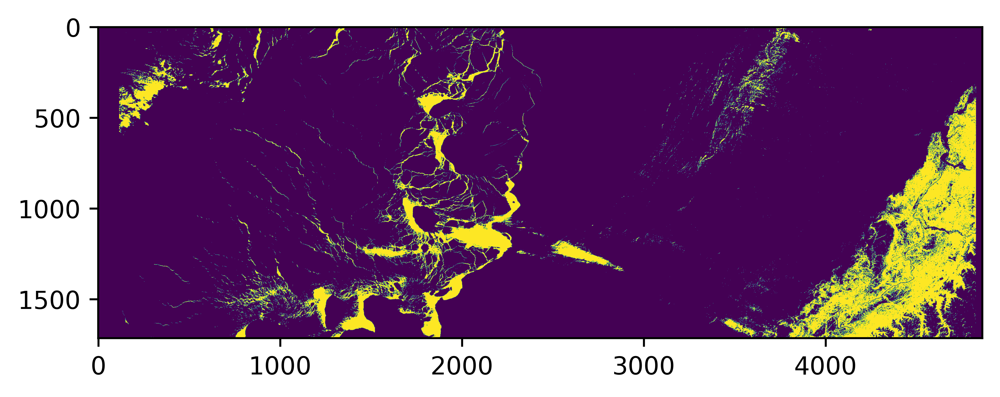

In [34]:
# map_cnn=y_pred1.reshape(roi.shape[0]-2, roi.shape[1]-2)
map_cnn=y_pred1.reshape(Patches_array.shape[1], Patches_array.shape[2])

# Alter the view setting
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600
# Show the map
plt.imshow(map_cnn)

plt.savefig('/content/drive/MyDrive/GEOL0069/Project/Figures/Map_CNN_2c.png', dpi=300, bbox_inches='tight', pad_inches=0.5)

In [8]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Define the model
model_cnn_c = models.Sequential()
model_cnn_c.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(3, 3, 4), padding='SAME'))
model_cnn_c.add(layers.MaxPooling2D((2, 2)))
# Add additional convolutional and pooling layers as needed
# ...

# Add dense layers for classification
model_cnn_c.add(layers.Flatten())
model_cnn_c.add(layers.Dense(64, activation='relu'))
model_cnn_c.add(layers.Dense(10, activation='softmax'))  # 10 is the number of classes

# Compile and train the model
model_cnn_c.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
model_cnn_c.fit(X_train_c[:,:,:,[2,5,7,16]], y_train_c, epochs=10, validation_split=0.1)

Epoch 1/10
300/300 [==============================] - 6s 6ms/step - loss: 0.7710 - accuracy: 0.5022 - val_loss: 0.7125 - val_accuracy: 0.4836
Epoch 2/10
300/300 [==============================] - 1s 3ms/step - loss: 0.6967 - accuracy: 0.5067 - val_loss: 0.7015 - val_accuracy: 0.4836
Epoch 3/10
300/300 [==============================] - 1s 3ms/step - loss: 0.6953 - accuracy: 0.5115 - val_loss: 0.6906 - val_accuracy: 0.5164
Epoch 4/10
300/300 [==============================] - 1s 3ms/step - loss: 0.6926 - accuracy: 0.5177 - val_loss: 0.6962 - val_accuracy: 0.4836
Epoch 5/10
300/300 [==============================] - 1s 3ms/step - loss: 0.6922 - accuracy: 0.5245 - val_loss: 0.6911 - val_accuracy: 0.4930
Epoch 6/10
300/300 [==============================] - 1s 3ms/step - loss: 0.6911 - accuracy: 0.5316 - val_loss: 0.6868 - val_accuracy: 0.5164
Epoch 7/10
300/300 [==============================] - 1s 3ms/step - loss: 0.6887 - accuracy: 0.5328 - val_loss: 0.6849 - val_accuracy: 0.5164
Epoch 

In [9]:
# The images are in numpy array format
image = np.load('/content/drive/MyDrive/GEOL0069/Project/Week3/S3A_OL_1_EFR____20180307T054004_20180307T054119_20180308T091959_0075_028_319_1620_LN1_O_NT_002.SEN3/chunk_3_band_04.npy')

y_pred=model_cnn_c.predict(x_test_all, batch_size = 250)
y_pred1 = np.argmax(y_pred,axis = 1)

33341/33341 [==============================] - 59s 2ms/step


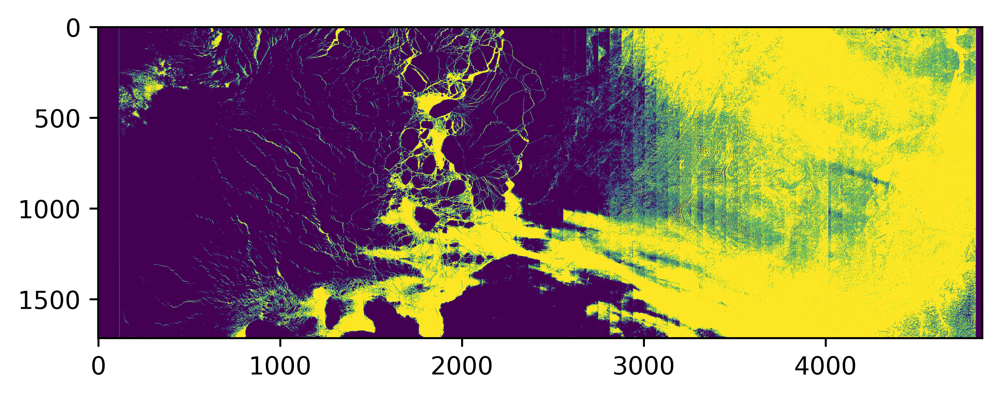

In [10]:
# map_cnn_c=y_pred1.reshape(roi.shape[0]-2, roi.shape[1]-2)
map_cnn_c=y_pred1.reshape(Patches_array.shape[1], Patches_array.shape[2])

# Alter the view setting
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600
# Show the map
plt.imshow(map_cnn_c)

plt.savefig('/content/drive/MyDrive/GEOL0069/Project/Figures/Map_CNN_4c.png', dpi=300, bbox_inches='tight', pad_inches=0.5)

## Random Forests

Random Forest is a notable and significant part of machine learning and is commonly used for classification. It can also be used for regression, but its application in classification is more prevalent. Decision Trees are the core components of a Random Forest, so let's delve into the concepts of Decision Trees {cite}`breiman2001random,quinlan1986induction`.

### Theoretical Foundations

### 1. **Ensemble Learning**

Ensemble methods employ multiple learning algorithms to achieve better predictive performance than any individual learning algorithm alone {cite}`dietterich2000ensemble`. The primary principle behind ensemble models is that several weak learners come together to form a strong learner.

### 2. **Decision Trees**

Decision trees are central to a Random Forest. They split data into subsets based on feature values, recursively producing a decision tree {cite}`quinlan1986induction`.

### 3. **Bootstrap Aggregating (Bagging)**

Random Forests leverage bagging, where multiple dataset subsets are created by drawing samples with replacement. A separate decision tree is built for each of these samples {cite}`breiman1996bagging`.

### 4. **Feature Randomness**

In conventional decision trees, the best feature is chosen to split data at every node. However, Random Forests introduce randomness by selecting a random set of features, then choosing the best split from this subset, ensuring a diverse ensemble of trees.


### Advantages

- **Generalisation**: By combining the predictions of multiple trees, Random Forests tend to generalize better and are less susceptible to overfitting on training data.
  
- **Parallel Processing**: Each decision tree can be built independently, allowing for parallel processing which speeds up the algorithm considerably for large datasets.

- **Handling Missing Values**: Random Forests can handle missing values and still produce reasonable predictions.

- **Importance Scoring**: They provide an importance score for each feature, aiding in feature selection or interpretability.

### Implementation in Python (Using Scikit-learn)



In [7]:
X_train_rf = X_train[:,:,:,[2,5,7,16]]
X_test_rf = X_test[:,:,:,[2,5,7,16]]

In [8]:
from sklearn.ensemble import RandomForestClassifier

# Initialise the model with n_estimators specifying the number of trees in the forest
clf = RandomForestClassifier(n_estimators=100)

# We need to reshape the data in order to be compatible with Random Forest
X_reshaped = np.reshape(X_train_rf, (X_train_rf.shape[0], -1))
# Fit the model to your training data
clf.fit(X_reshaped, y_train)

# Predict the classes of the test data
X_test_reshaped = np.reshape(X_test_rf, (X_test_rf.shape[0], -1))
y_pred = clf.predict(X_test_reshaped)

model_rf = clf

In [ ]:
# Extracting the mask_area values from the JSON
# Extracting the region of interest (ROI)
x1, y1, x2, y2 = [350, 800, 550, 1100]

# Extracting the region of interest (ROI) from the image
roi = image[y1:y2, x1:x2]

# roi is your data with shape (300, 200, 21)
patches = []

# Iterate over the height and width of the roi, excluding the border pixels
for i in range(1, roi.shape[0] - 1):
    for j in range(1, roi.shape[1] - 1):
        # Extract a (3, 3, 21) patch centered around the pixel (i, j)
        patch = roi[i-1:i+2, j-1:j+2, :]
        patches.append(patch)

# Convert the list of patches to a numpy array
x_test_all = np.array(patches)

In [9]:
x_test_all = x_test_all.reshape(-1, 3*3*4)

In [11]:
# The images are in numpy array format
image = np.load('/content/drive/MyDrive/GEOL0069/Project/Week3/S3A_OL_1_EFR____20180307T054004_20180307T054119_20180308T091959_0075_028_319_1620_LN1_O_NT_002.SEN3/chunk_3_band_04.npy')

# Make predictions on the full image
y_pred=model_rf.predict(x_test_all)
# y_pred1 = np.argmax(y_pred,axis = 1)

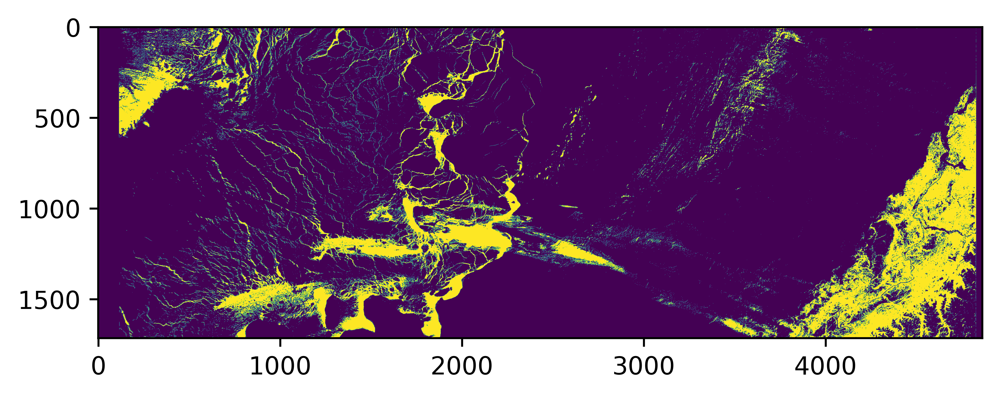

In [12]:
# map_rf=y_pred.reshape(roi.shape[0]-2, roi.shape[1]-2)
map_rf=y_pred.reshape(Patches_array.shape[1], Patches_array.shape[2])

# Alter the view setting
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['figure.dpi'] = 600
# Show the map
plt.imshow(map_rf)

plt.savefig('/content/drive/MyDrive/GEOL0069/Project/Figures/Map_RF_2c.png', dpi=300, bbox_inches='tight', pad_inches=0.5)

In [13]:
X_train_rf_c = X_train_c[:,:,:,[2,5,7,16]]
X_test_rf_c = X_test_c[:,:,:,[2,5,7,16]]

In [14]:
from sklearn.ensemble import RandomForestClassifier

# Initialise the model with n_estimators specifying the number of trees in the forest
clf_c = RandomForestClassifier(n_estimators=100)

# We need to reshape the data in order to be compatible with Random Forest
X_reshaped_c = np.reshape(X_train_rf_c, (X_train_rf_c.shape[0], -1))
# Fit the model to your training data
clf_c.fit(X_reshaped_c, y_train_c)

# Predict the classes of the test data
X_test_reshaped_c = np.reshape(X_test_rf_c, (X_test_rf_c.shape[0], -1))
y_pred_c = clf_c.predict(X_test_reshaped_c)

model_rf_c = clf_c

In [15]:
# Make predictions on the full image
y_pred_c=model_rf_c.predict(x_test_all)

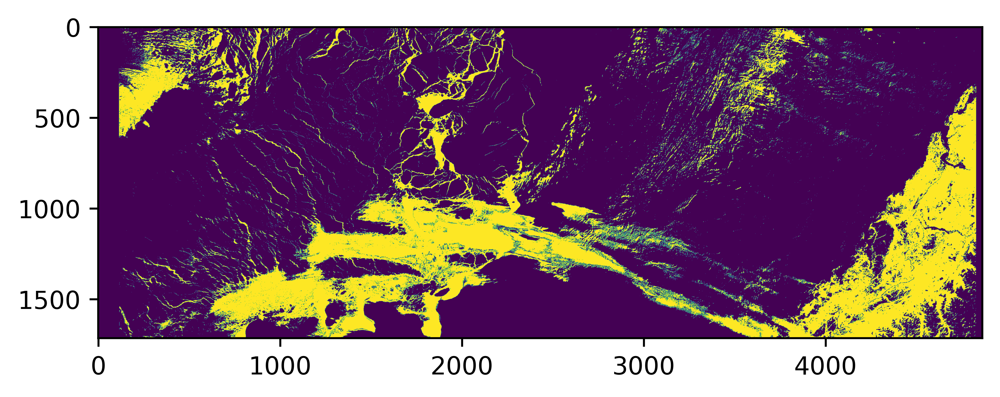

In [16]:
# map_rf_c=y_pred_c.reshape(roi.shape[0]-2, roi.shape[1]-2)
map_rf_c=y_pred_c.reshape(Patches_array.shape[1], Patches_array.shape[2])

# Alter the view setting
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['figure.dpi'] = 600
# Show the map
plt.imshow(map_rf_c)

plt.savefig('/content/drive/MyDrive/GEOL0069/Project/Figures/Map_RF_4c.png', dpi=300, bbox_inches='tight', pad_inches=0.5)

## Vision Transformer (ViT)

Vision Transformers (ViTs) are a recent breakthrough in the field of deep learning for image processing. They depart from the traditional convolutional neural network (CNN) approach and apply transformers, which were originally designed for natural language processing tasks, to image classification.

### Theoretical Foundations

### 1. **Tokenisation of Images**

Instead of processing images using convolutions, ViTs divide the image into fixed-size patches, linearly embed them, and then process the resulting sequence of vectors (or tokens) using a transformer.{cite}`dosovitskiy2020image`

### 2. **Position Embeddings**

Since the original transformer doesn't have a notion of the relative positions of tokens, positional embeddings are added to the patch embeddings to retain the positional information.{cite}`dosovitskiy2020image`

### 3. **Transformer Architecture**

The core of ViT is the transformer architecture, which consists of multiple layers of multi-head self-attention mechanisms and feed-forward neural networks.{cite}`dosovitskiy2020image`

### 4. **Classification Head**

After processing through the transformer layers, the embedding of the first token (often referred to as the 'CLS' token) is used to classify the image.{cite}`dosovitskiy2020image`

### Advantages of ViT

- **Model Transferability**: ViTs pre-trained on large datasets can be fine-tuned on smaller datasets, achieving high performance even when the available labeled data is limited.

- **Scalability**: ViTs are more data-hungry compared to CNNs. However, their performance continues to improve as the model size and the amount of data increase, often surpassing other architectures.

- **Flexibility**: The transformer architecture isn't specialized for grid-like data (like images), making ViTs potentially more flexible for varied input data types.

### Challenges

- **Computational Demand**: ViTs can be computationally intensive, especially when dealing with large images or when the model has many layers.

- **Data Requirement**: To achieve optimal performance, ViTs often require more training data compared to CNNs.

### Implementation
The implmentation of Vision Transformer is much more complicated than CNN and Random Forest as there is no built-in functions or layers in the library. However, the following code uses some existing functions like Muliti-head attention to build the transformer block. You don't need to know the exactly and detailed structure of ViT as it is not required in this course. Please follow the code below for example of implementation.

In [7]:
# Install this additional Tensorflow package for ViT
! pip install -U tensorflow-addons

In [8]:
# Install packages needed
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [9]:
X_train = X_train[:,:,:,[2,5,7,16]]
X_test = X_test[:,:,:,[2,5,7,16]]

In [10]:
#=========================================================================================================
#=========================================================================================================
#=========================================================================================================

def mlp(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x
class Patches(layers.Layer):
    def __init__(self, patch_size):
        super(Patches, self).__init__()
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches
#=========================================================================================================
#=========================================================================================================
#=========================================================================================================
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super(PatchEncoder, self).__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(
            input_dim=num_patches, output_dim=projection_dim
        )

    def call(self, patch):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        encoded = self.projection(patch) + self.position_embedding(positions)
        return encoded

#=========================================================================================================
#=========================================================================================================
#=========================================================================================================
def create_vit_classifier():
    inputs = layers.Input(shape=input_shape)
    # Augment data.
    augmented = more_data(inputs)
    # Create patches.
    patches = Patches(patch_size)(augmented)
    # Encode patches.
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)

    # Create multiple layers of the Transformer block.
    for _ in range(transformer_layers):
        # Layer normalization 1.
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        # Create a multi-head attention layer.
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=projection_dim, dropout=0.1
        )(x1, x1)
        # Skip connection 1.
        x2 = layers.Add()([attention_output, encoded_patches])
        # Layer normalization 2.
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        # MLP.
        x3 = mlp(x3, hidden_units=transformer_units, dropout_rate=0.1)
        # Skip connection 2.
        encoded_patches = layers.Add()([x3, x2])

    # Create a [batch_size, projection_dim] tensor.
    representation = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    representation = layers.Flatten()(representation)
    representation = layers.Dropout(0.5)(representation)
    # Add MLP.
    features = mlp(representation, hidden_units=mlp_head_units, dropout_rate=0.5)
    # Classify outputs.
    logits = layers.Dense(num_classes)(features)
    # Create the Keras model.
    model = keras.Model(inputs=inputs, outputs=logits)
    return model
#=========================================================================================================
#=========================================================================================================
#=========================================================================================================
def run_experiment(model):
    optimizer = tfa.optimizers.AdamW(
        learning_rate=learning_rate, weight_decay=weight_decay
    )

    model.compile(
        optimizer=optimizer,
        loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=[
            keras.metrics.SparseCategoricalAccuracy(name="accuracy"),
            keras.metrics.SparseTopKCategoricalAccuracy(5, name="top-5-accuracy"),
        ],
    )

    checkpoint_filepath = "/tmp/checkpoint"
    checkpoint_callback = keras.callbacks.ModelCheckpoint(
        checkpoint_filepath,
        monitor="val_accuracy",
        save_best_only=True,
        save_weights_only=True,
    )

    history = model.fit(
        x=X_train,
        y=y_train,
        batch_size=30,
        # epochs=20,
        epochs=10,
        validation_split=0.1,
        callbacks=[checkpoint_callback],
    )

    model.load_weights(checkpoint_filepath)
    _, accuracy, top_5_accuracy = model.evaluate(X_test, y_test)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")
    print(f"Test top 5 accuracy: {round(top_5_accuracy * 100, 2)}%")

    return history

In [11]:
num_classes = 2 #Can be changed to multi-classed classification
input_shape = (3, 3, 4) #depends on the size of the image we want

learning_rate = 0.001
weight_decay = 0.0001
batch_size = 256
# num_epochs = 100
num_epochs = 50
image_size = 72
patch_size = 6
num_patches = (image_size // patch_size) ** 2
projection_dim = 64
num_heads = 4
transformer_units = [
    projection_dim * 2,
    projection_dim,
]
transformer_layers = 8
mlp_head_units = [2048, 1024]

In [12]:
# Data augmentation
more_data = keras.Sequential(
    [
        layers.Normalization(),
        layers.Resizing(image_size, image_size),
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(factor=0.02),
        layers.RandomZoom(
            height_factor=0.2, width_factor=0.2
        ),
    ],
    name="more_data",
)
more_data.layers[0].adapt(X_train)

In [13]:
X_train.shape

(11482, 3, 3, 4)

In [14]:
# Here vit is your trained model after the training
vit = create_vit_classifier()
history = run_experiment(vit)

# vit.save('/content/drive/MyDrive/GEOL0069/Project/Week2/Model_VIT')

Epoch 1/10
345/345 [==============================] - 54s 74ms/step - loss: 1.2483 - accuracy: 0.7183 - top-5-accuracy: 1.0000 - val_loss: 0.4510 - val_accuracy: 0.7911 - val_top-5-accuracy: 1.0000
Epoch 2/10
345/345 [==============================] - 23s 67ms/step - loss: 0.3895 - accuracy: 0.8292 - top-5-accuracy: 1.0000 - val_loss: 0.2679 - val_accuracy: 0.8973 - val_top-5-accuracy: 1.0000
Epoch 3/10
345/345 [==============================] - 24s 71ms/step - loss: 0.2607 - accuracy: 0.8961 - top-5-accuracy: 1.0000 - val_loss: 0.2737 - val_accuracy: 0.8982 - val_top-5-accuracy: 1.0000
Epoch 4/10
345/345 [==============================] - 26s 74ms/step - loss: 0.2433 - accuracy: 0.9021 - top-5-accuracy: 1.0000 - val_loss: 0.2350 - val_accuracy: 0.9121 - val_top-5-accuracy: 1.0000
Epoch 5/10
345/345 [==============================] - 25s 71ms/step - loss: 0.2476 - accuracy: 0.9021 - top-5-accuracy: 1.0000 - val_loss: 0.2231 - val_accuracy: 0.9217 - val_top-5-accuracy: 1.0000
Epoch 6/10

In [ ]:
# model_vit = tf.keras.models.load_model('/content/drive/MyDrive/GEOL0069/Project/Week2/Model_VIT')

In [ ]:
# Extracting the mask_area values from the JSON
# Extracting the region of interest (ROI)
x1, y1, x2, y2 = [350, 800, 550, 1100]

# Extracting the region of interest (ROI) from the image
roi = image[y1:y2, x1:x2]

# roi is your data with shape (300, 200, 21)
patches = []

# Iterate over the height and width of the roi, excluding the border pixels
for i in range(1, roi.shape[0] - 1):
    for j in range(1, roi.shape[1] - 1):
        # Extract a (3, 3, 21) patch centered around the pixel (i, j)
        patch = roi[i-1:i+2, j-1:j+2, :]
        patches.append(patch)

# Convert the list of patches to a numpy array
x_test_all = np.array(patches)

In [15]:
# The images are in numpy array format
image = np.load('/content/drive/MyDrive/GEOL0069/Project/Week3/S3A_OL_1_EFR____20180307T054004_20180307T054119_20180308T091959_0075_028_319_1620_LN1_O_NT_002.SEN3/chunk_3_band_04.npy')

In [16]:
x_test_all.shape

(8335182, 3, 3, 4)

In [17]:
y_pred=vit.predict(x_test_all, batch_size = 250)
y_pred1 = np.argmax(y_pred,axis = 1)

33341/33341 [==============================] - 3873s 116ms/step


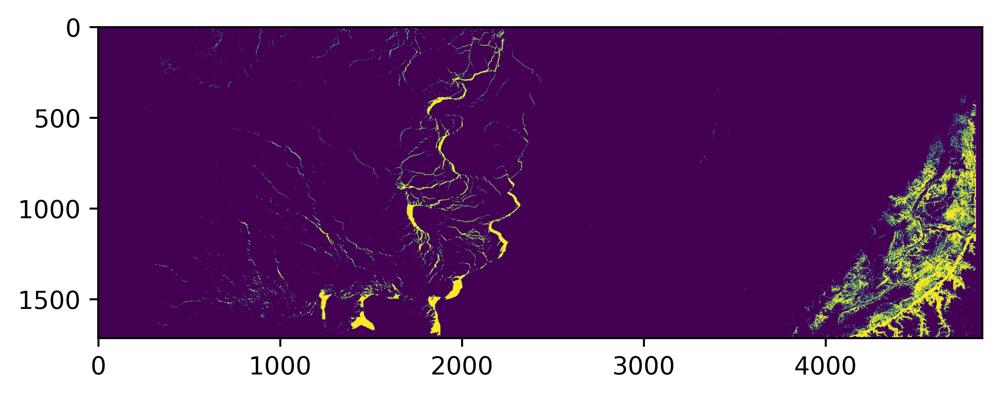

In [18]:
# map_vit=y_pred1.reshape(roi.shape[0]-2, roi.shape[1]-2)
map_vit=y_pred1.reshape(Patches_array.shape[1], Patches_array.shape[2])

# Alter the view setting
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['figure.dpi'] = 600
# Show the map
plt.imshow(map_vit)

plt.savefig('/content/drive/MyDrive/GEOL0069/Project/Figures/Map_ViT_2c.png', dpi=300, bbox_inches='tight', pad_inches=0.5)

In [19]:
X_train_c = X_train_c[:,:,:,[2,5,7,16]]
X_test_c = X_test_c[:,:,:,[2,5,7,16]]

In [20]:
# Data augmentation
more_data = keras.Sequential(
    [
        layers.Normalization(),
        layers.Resizing(image_size, image_size),
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(factor=0.02),
        layers.RandomZoom(
            height_factor=0.2, width_factor=0.2
        ),
    ],
    name="more_data",
)
more_data.layers[0].adapt(X_train_c)

In [21]:
# Here vit is your trained model after the training
vit_c = create_vit_classifier()
history_c = run_experiment(vit_c)

# vit.save('/content/drive/MyDrive/GEOL0069/Project/Week2/Model_VIT')

Epoch 1/10
345/345 [==============================] - 36s 72ms/step - loss: 1.1100 - accuracy: 0.7332 - top-5-accuracy: 1.0000 - val_loss: 0.3620 - val_accuracy: 0.8651 - val_top-5-accuracy: 1.0000
Epoch 2/10
345/345 [==============================] - 25s 74ms/step - loss: 0.3330 - accuracy: 0.8602 - top-5-accuracy: 1.0000 - val_loss: 0.2548 - val_accuracy: 0.8886 - val_top-5-accuracy: 1.0000
Epoch 3/10
345/345 [==============================] - 23s 66ms/step - loss: 0.2625 - accuracy: 0.8969 - top-5-accuracy: 1.0000 - val_loss: 0.2226 - val_accuracy: 0.9164 - val_top-5-accuracy: 1.0000
Epoch 4/10
345/345 [==============================] - 22s 64ms/step - loss: 0.2460 - accuracy: 0.9021 - top-5-accuracy: 1.0000 - val_loss: 0.2282 - val_accuracy: 0.9043 - val_top-5-accuracy: 1.0000
Epoch 5/10
345/345 [==============================] - 27s 77ms/step - loss: 0.2306 - accuracy: 0.9107 - top-5-accuracy: 1.0000 - val_loss: 0.2262 - val_accuracy: 0.9182 - val_top-5-accuracy: 1.0000
Epoch 6/10

In [22]:
y_pred=vit_c.predict(x_test_all, batch_size = 250)
y_pred1 = np.argmax(y_pred,axis = 1)

33341/33341 [==============================] - 3887s 117ms/step


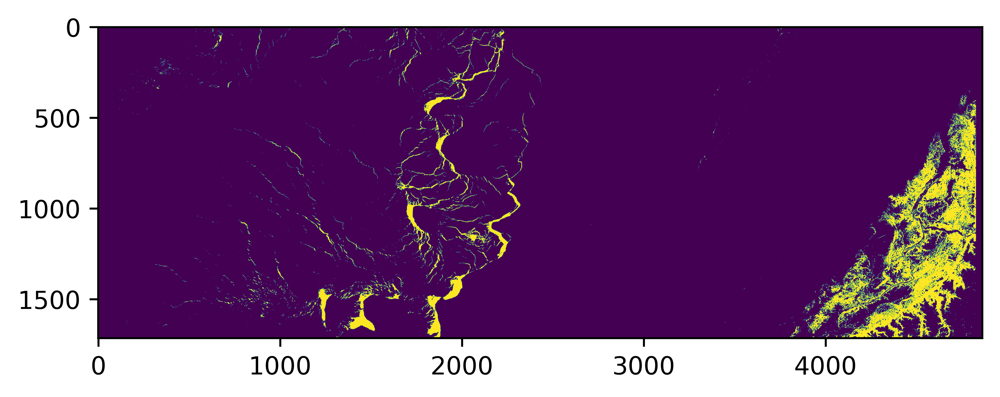

In [23]:
# map_vit_c=y_pred1.reshape(roi.shape[0]-2, roi.shape[1]-2)
map_vit_c=y_pred1.reshape(Patches_array.shape[1], Patches_array.shape[2])

# Alter the view setting
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['figure.dpi'] = 600
# Show the map
plt.imshow(map_vit_c)

plt.savefig('/content/drive/MyDrive/GEOL0069/Project/Figures/Map_ViT_4c.png', dpi=300, bbox_inches='tight', pad_inches=0.5)